In [1]:
!nvidia-smi

Wed Nov 20 04:44:37 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.5/112.6 GB disk)


In [3]:
from ultralytics import YOLO

from IPython.display import display, Image

In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ewmqQYUPWnZlOqiEKhMl")
project = rf.workspace("test-levac").project("elephant_house_label")
version = project.version(16)
dataset = version.download("yolov9")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.9 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Elephant_House_Label-16 in yolov9:: 100%|██████████| 3331/3331 [00:00<00:00, 4556.56it/s]


In [5]:
from ultralytics import YOLO

# Build a YOLOv9c model from scratch
model = YOLO("yolov9c.yaml")

# Build a YOLOv9c model from pretrained weight
model = YOLO("yolov9c.pt")

# Display model information (optional)
model.info()

# # Train the model on the COCO8 example dataset for 100 epochs
# results = model.train(data="coco8.yaml", epochs=100, imgsz=640)

# # Run inference with the YOLOv9c model on the 'bus.jpg' image
# results = model("path/to/bus.jpg")

100%|██████████| 49.4M/49.4M [00:00<00:00, 101MB/s] 


YOLOv9c summary: 618 layers, 25,590,912 parameters, 0 gradients, 104.0 GFLOPs


(618, 25590912, 0, 104.02268160000003)

In [6]:
import os
os.environ['WANDB_MODE'] = 'disabled'

In [ ]:
results = model.train(data='data.yaml', epochs=200, imgsz=640)

Ultralytics 8.3.34 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov9c.pt, data=data.yaml, epochs=200, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_widt

100%|██████████| 755k/755k [00:00<00:00, 20.2MB/s]


Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    212864  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 256, 128, 64, 1]        
  3                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
  4                  -1  1    847616  ultralytics.nn.modules.block.RepNCSPELAN4    [256, 512, 256, 128, 1]       
  5                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  6                  -1  1   2857472  ultralytics.nn.modules.block.RepNCSPELAN4    [512, 512, 512, 256, 1]       
  7                  -1  1    656384  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 95.9MB/s]


AMP: checks passed ✅


train: Scanning /content/datasets/Elephant_House_Label-16/train/labels... 1601 images, 3 backgrounds, 0 corrupt: 100%|██████████| 1601/1601 [00:01<00:00, 1564.65it/s]


train: New cache created: /content/datasets/Elephant_House_Label-16/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/datasets/Elephant_House_Label-16/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 1054.44it/s]

val: New cache created: /content/datasets/Elephant_House_Label-16/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      11.2G     0.6059      2.257      1.044          3        640: 100%|██████████| 101/101 [01:22<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]

                   all         60        108      0.747      0.401      0.483      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      11.2G     0.6943      1.609      1.068          5        640: 100%|██████████| 101/101 [01:21<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.70it/s]

                   all         60        108      0.842      0.341      0.439      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      11.2G     0.7642      1.504      1.111          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.55it/s]

                   all         60        108      0.668      0.319      0.265      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      11.2G     0.7713      1.504      1.109          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]

                   all         60        108      0.861      0.442      0.538      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      11.2G     0.7332      1.332      1.099          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        108      0.712      0.644      0.713      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      11.1G     0.6856       1.21      1.063          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]

                   all         60        108      0.546      0.518      0.519      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      11.2G     0.6572       1.19      1.057          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         60        108      0.842      0.486      0.645      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      11.2G     0.6187       1.08      1.027          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         60        108      0.743      0.512      0.596      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      11.2G     0.6165      1.066      1.029          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]

                   all         60        108      0.785      0.684      0.845       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      11.1G     0.5867     0.9841      1.021          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108       0.71      0.855      0.812      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      11.2G     0.5767     0.9862      1.015          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.48it/s]

                   all         60        108      0.771      0.713      0.675      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      11.2G      0.539      0.913     0.9951          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

                   all         60        108      0.824      0.682      0.757      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      11.2G     0.5414     0.8817     0.9926          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]

                   all         60        108      0.558      0.863      0.769      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      11.1G     0.5212     0.8176     0.9838          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]

                   all         60        108      0.766      0.776      0.795      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      11.2G     0.5196     0.8124       0.98          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.50it/s]

                   all         60        108      0.674      0.821       0.86       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      11.2G     0.5021     0.7955     0.9755          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]

                   all         60        108      0.882      0.698      0.806      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      11.2G     0.4808     0.7375     0.9603          5        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.53it/s]

                   all         60        108      0.878      0.704      0.808      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      11.1G     0.4761     0.7199     0.9603          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         60        108      0.705      0.787      0.841      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      11.2G     0.4773     0.7333     0.9563          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.795        0.8      0.851      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      11.2G     0.4932     0.7165     0.9668          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

                   all         60        108      0.795      0.777      0.832       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      11.2G     0.4544     0.7027      0.953          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.838      0.757      0.803       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      11.1G     0.4565     0.7448     0.9414          0        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]

                   all         60        108       0.87       0.72      0.859        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      11.2G     0.4482     0.7317     0.9363          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

                   all         60        108      0.873      0.705       0.78       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      11.2G     0.4472     0.6437      0.937          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.772      0.816      0.887      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      11.2G     0.4305     0.6309     0.9407          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.48it/s]

                   all         60        108      0.797      0.789      0.851      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      11.2G     0.4434     0.6039     0.9349          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all         60        108      0.904      0.713       0.82      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      11.2G     0.4335     0.6217     0.9363          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

                   all         60        108       0.85      0.731      0.808      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      11.2G     0.4273     0.5812     0.9344          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.50it/s]

                   all         60        108      0.791      0.819      0.873      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      11.2G     0.4304     0.5876     0.9347          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         60        108      0.921      0.739      0.777       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      11.1G     0.4206     0.5827     0.9389          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all         60        108      0.682      0.881      0.881      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      11.2G     0.4161     0.5446     0.9241          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.811      0.801      0.875      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      11.2G     0.4075     0.5674     0.9195          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.48it/s]

                   all         60        108      0.868      0.723      0.799      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      11.2G     0.4047     0.5531     0.9257          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.746      0.807      0.882      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      11.1G     0.3965     0.5381       0.92          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all         60        108      0.807       0.74      0.751      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      11.2G     0.4068      0.522     0.9246          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.47it/s]

                   all         60        108      0.693      0.798      0.815      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      11.2G     0.3929     0.5103     0.9108          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         60        108      0.818      0.721      0.716      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      11.2G     0.4117      0.523     0.9318          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

                   all         60        108      0.753      0.864      0.887      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      11.1G     0.3992     0.4885     0.9277          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         60        108      0.856        0.7      0.828       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      11.2G     0.3807     0.4956     0.9137          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.40it/s]

                   all         60        108      0.735       0.84      0.837      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      11.2G     0.3905     0.4997     0.9177          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108       0.91      0.766      0.843      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      11.2G     0.3867     0.4875     0.9183          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all         60        108      0.804      0.879      0.894      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      11.1G     0.3775      0.481      0.909          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]

                   all         60        108      0.862      0.795       0.86       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      11.2G     0.3831     0.4615     0.9068          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.692      0.835      0.837      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      11.2G     0.3746     0.4699     0.9042          7        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        108      0.855      0.797      0.901      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      11.2G     0.3789     0.4643     0.9103          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]

                   all         60        108      0.799      0.763      0.725      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      11.2G      0.384     0.4549     0.9235          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.44it/s]

                   all         60        108       0.84      0.709      0.796      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      11.2G     0.3665     0.4502      0.908          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.872      0.834      0.926      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      11.2G      0.366     0.4258     0.9011          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]

                   all         60        108      0.779      0.822       0.78      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      11.2G       0.36     0.4522     0.8978          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        108      0.887      0.791      0.875      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      11.1G     0.3627     0.4718     0.9173          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        108      0.743      0.776      0.831      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      11.2G     0.3632     0.4379     0.9006          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.54it/s]

                   all         60        108      0.861       0.79      0.855       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      11.2G     0.3572     0.4268     0.9012          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.41it/s]

                   all         60        108      0.842      0.769      0.832      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      11.2G     0.3512     0.4025     0.8976          5        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.896      0.774      0.871      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      11.2G     0.3571     0.3908     0.9014          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         60        108      0.861      0.787       0.88      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      11.2G     0.3549     0.4159     0.8977          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all         60        108      0.861      0.822      0.894      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      11.2G     0.3501     0.3847     0.8931          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.44it/s]

                   all         60        108       0.96      0.853      0.913      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      11.2G      0.337     0.3871      0.895          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        108      0.918      0.737      0.852        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      11.2G     0.3502     0.3906     0.8965          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.942      0.801      0.874      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      11.2G     0.3416     0.4168     0.8943          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

                   all         60        108       0.86      0.801      0.868      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      11.2G     0.3631     0.4042     0.9158          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.33it/s]

                   all         60        108      0.903      0.772      0.876      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      11.2G     0.3386     0.3889     0.8917          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        108      0.912      0.784      0.871       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      11.1G     0.3511     0.3704     0.8948          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.69it/s]

                   all         60        108      0.902      0.796      0.856      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      11.2G     0.3328     0.4694     0.8773          0        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

                   all         60        108       0.88      0.882      0.896      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      11.2G     0.3471     0.3693     0.9133          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         60        108      0.846      0.798      0.874      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      11.2G     0.3392     0.3857     0.8917          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         60        108      0.855       0.76      0.873      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      11.1G     0.3194     0.3523     0.8791          5        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.828      0.781      0.828      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      11.2G     0.3236     0.3761     0.8895          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        108      0.733      0.823      0.833      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      11.2G     0.3185     0.3554     0.8815          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108       0.87      0.804      0.877      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      11.2G     0.3153     0.3459     0.8804          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.44it/s]

                   all         60        108      0.904      0.771      0.892      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      11.1G     0.3301       0.37     0.8914          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.63it/s]

                   all         60        108       0.86      0.837      0.886      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      11.2G     0.3275     0.3691     0.8849          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         60        108      0.859      0.847      0.896      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      11.2G     0.3179     0.3417     0.8849          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

                   all         60        108       0.92      0.877      0.903      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      11.2G     0.3233     0.3378     0.8911          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.843      0.833      0.888      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      11.2G     0.3329     0.3536     0.8895          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.43it/s]

                   all         60        108      0.917       0.84      0.903       0.86



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      11.2G     0.3318     0.3516     0.8917          2        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.30it/s]

                   all         60        108      0.845      0.764       0.87      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      11.2G      0.315     0.3367     0.8826          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.68it/s]

                   all         60        108      0.839      0.818      0.777      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      11.2G     0.3087      0.327     0.8845          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.67it/s]

                   all         60        108      0.877        0.8      0.871      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      11.1G     0.3121     0.3233     0.8727          0        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        108      0.804      0.865      0.874      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      11.2G      0.315     0.3573     0.8761          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         60        108      0.902      0.851      0.907      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      11.2G     0.3146     0.3196      0.873          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.43it/s]

                   all         60        108      0.846      0.798      0.827       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      11.2G     0.3158      0.331     0.8826          1        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]

                   all         60        108      0.786       0.86      0.825      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      11.1G     0.3224     0.3432     0.8888          4        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.66it/s]

                   all         60        108      0.823      0.741      0.781      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      11.2G     0.3093      0.314     0.8792          5        640: 100%|██████████| 101/101 [01:20<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         60        108      0.884      0.813      0.895      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      11.2G     0.3134     0.3242     0.8843          3        640: 100%|██████████| 101/101 [01:20<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.47it/s]

                   all         60        108      0.854      0.818       0.91      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      11.1G     0.2963     0.3034     0.8739         39        640:  84%|████████▍ | 85/101 [01:08<00:12,  1.25it/s]

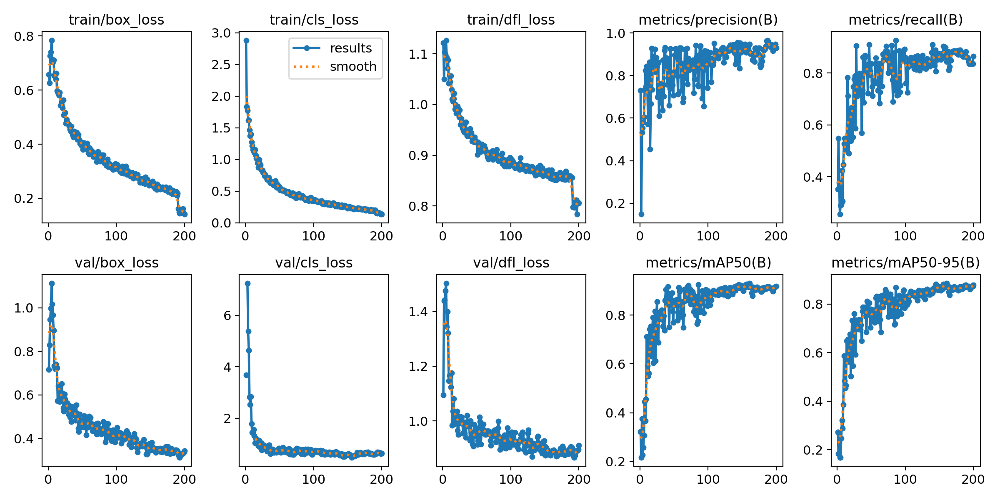

In [ ]:
Image(filename='/content/runs/detect/train/results.png', width=600)

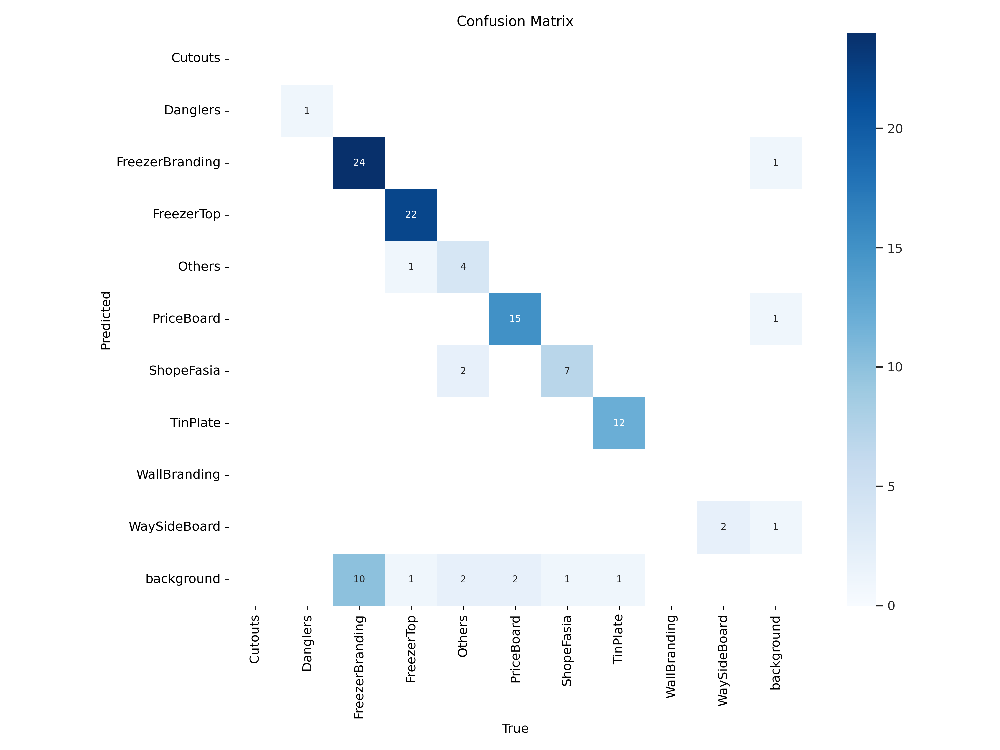

In [ ]:
Image(filename='/content/runs/detect/train/confusion_matrix.png', width=600)

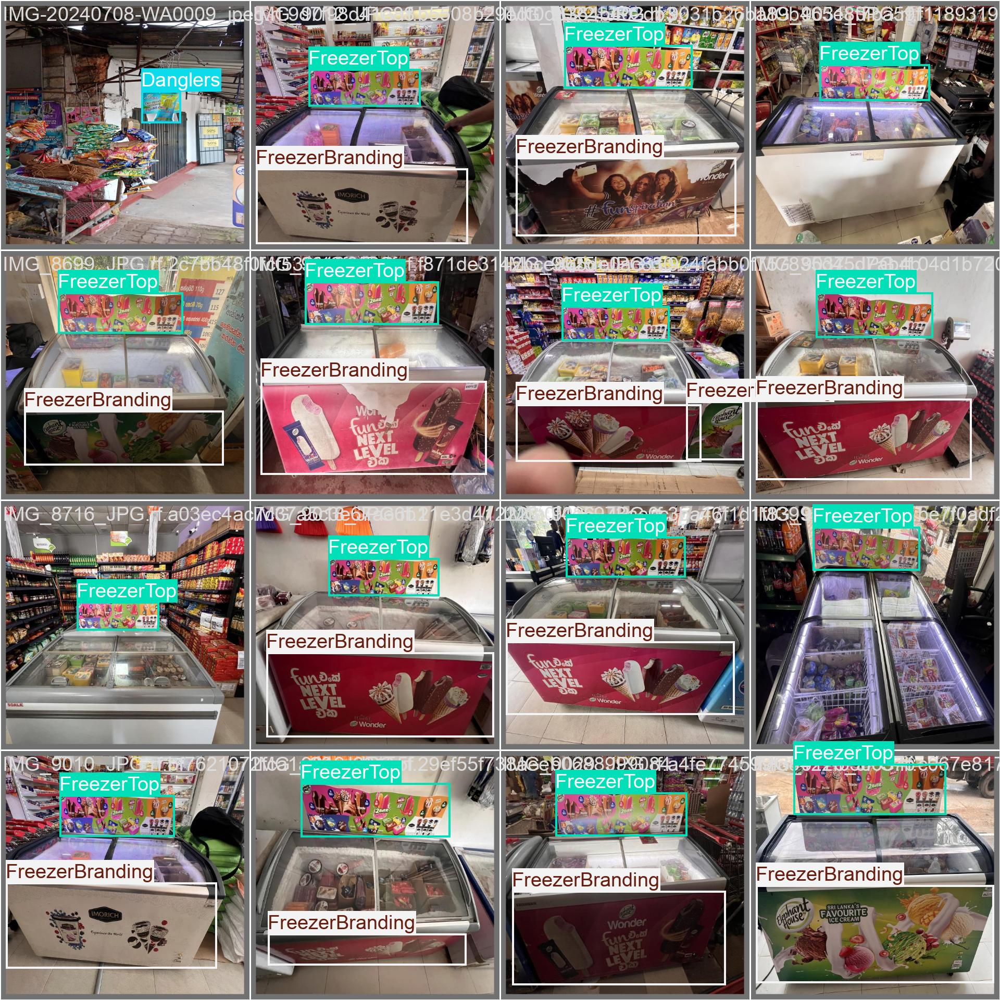

In [ ]:
Image(filename='/content/runs/detect/train/val_batch0_labels.jpg', width=600)

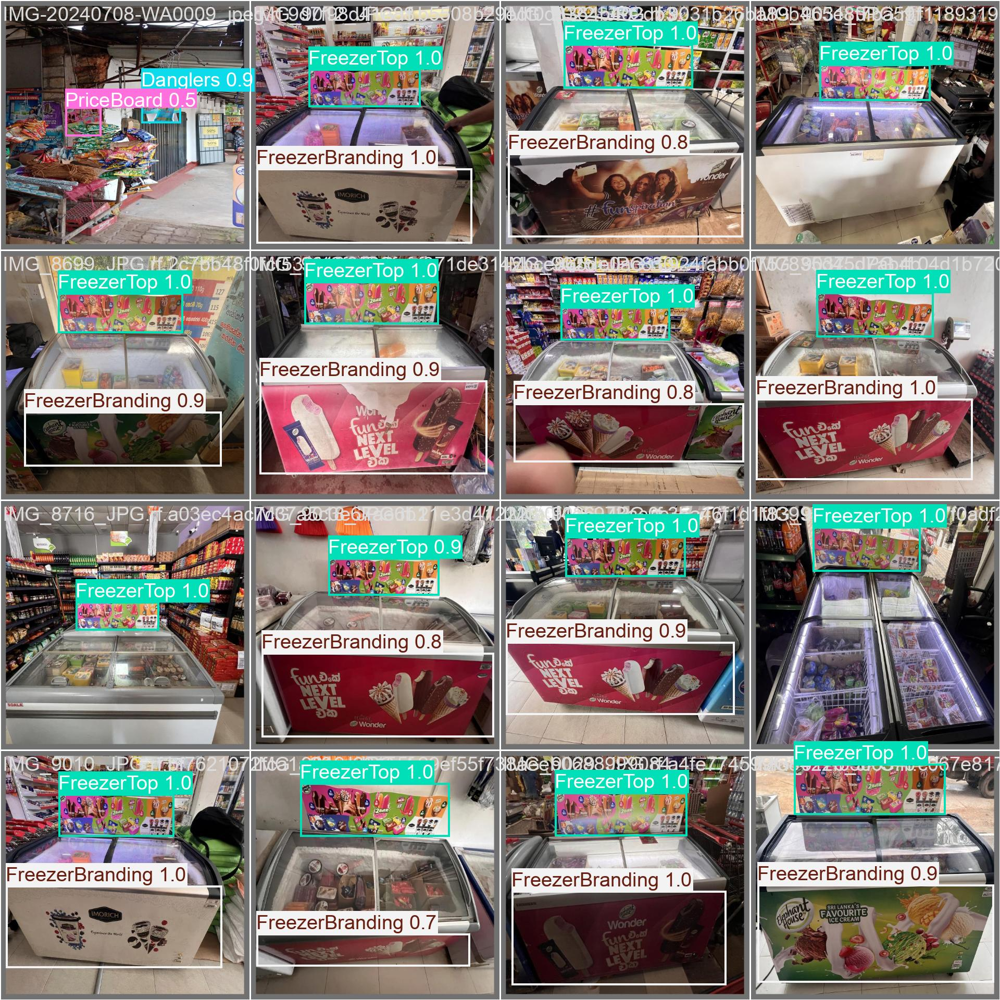

In [ ]:
Image(filename='/content/runs/detect/train/val_batch0_pred.jpg', width=600)

In [ ]:
results = model.predict('/content/datasets/Elephant_House_Label-15/valid/images', save=True, conf=0.5)


image 1/60 /content/datasets/Elephant_House_Label-15/valid/images/IMG-20240708-WA0009_jpeg.rf.9d7f98d41e884a20b01ef22e9d0569cf.jpg: 640x640 1 Danglers, 49.0ms
image 2/60 /content/datasets/Elephant_House_Label-15/valid/images/IMG_8699_JPG.rf.2c7bb48f0fcf533f12f85b3fcc6471ce.jpg: 640x640 1 FreezerBranding, 1 FreezerTop, 40.0ms
image 3/60 /content/datasets/Elephant_House_Label-15/valid/images/IMG_8716_JPG.rf.a03ec4ac7c37a5c3e67ae6b1d2f2a3c2.jpg: 640x640 1 FreezerTop, 39.9ms
image 4/60 /content/datasets/Elephant_House_Label-15/valid/images/IMG_9010_JPG.rf.bf7621072fca1a20cd68155f53781672.jpg: 640x640 1 FreezerBranding, 1 FreezerTop, 39.9ms
image 5/60 /content/datasets/Elephant_House_Label-15/valid/images/IMG_9012_JPG.rf.b5508b29edf0d3364b402db3dd824ff6.jpg: 640x640 1 FreezerBranding, 1 FreezerTop, 31.3ms
image 6/60 /content/datasets/Elephant_House_Label-15/valid/images/IMG_9016_JPG.rf.f871de3142bce865de0ac83006e15c39.jpg: 640x640 1 FreezerBranding, 1 FreezerTop, 28.0ms
image 7/60 /content

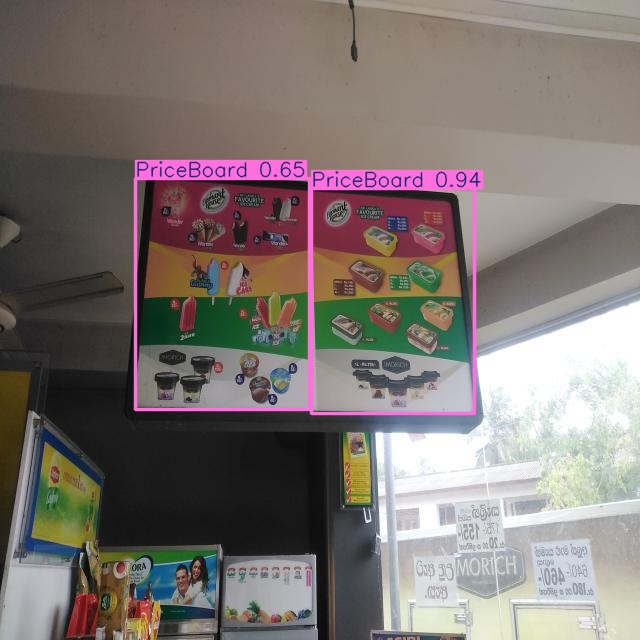

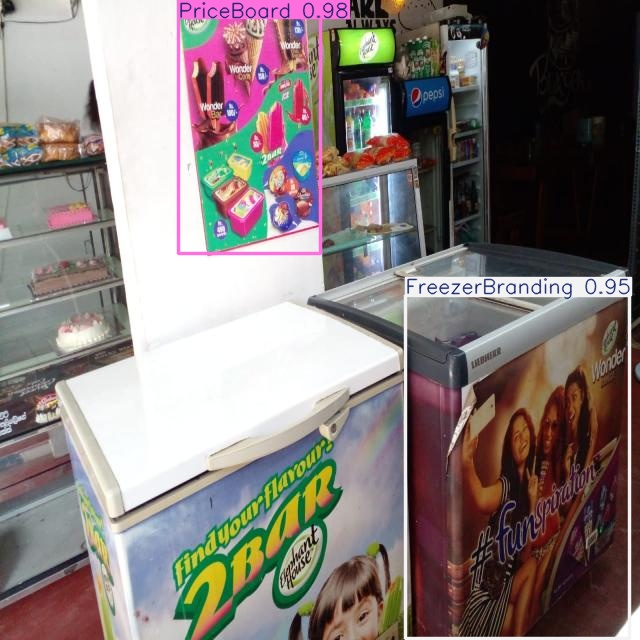

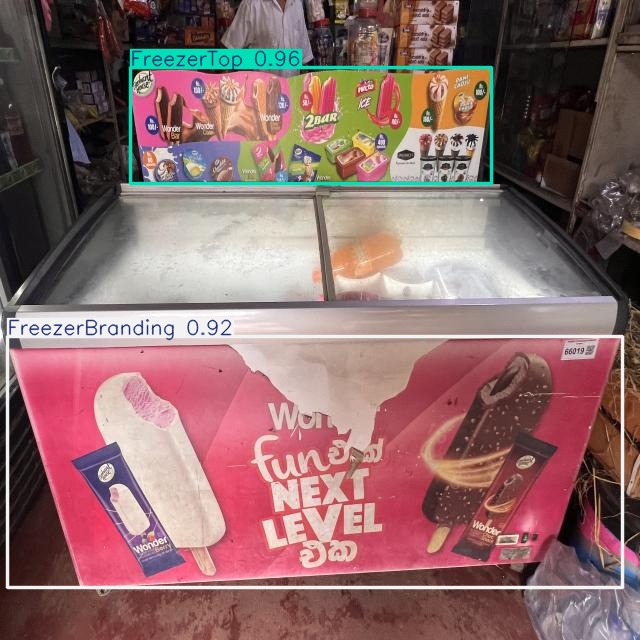

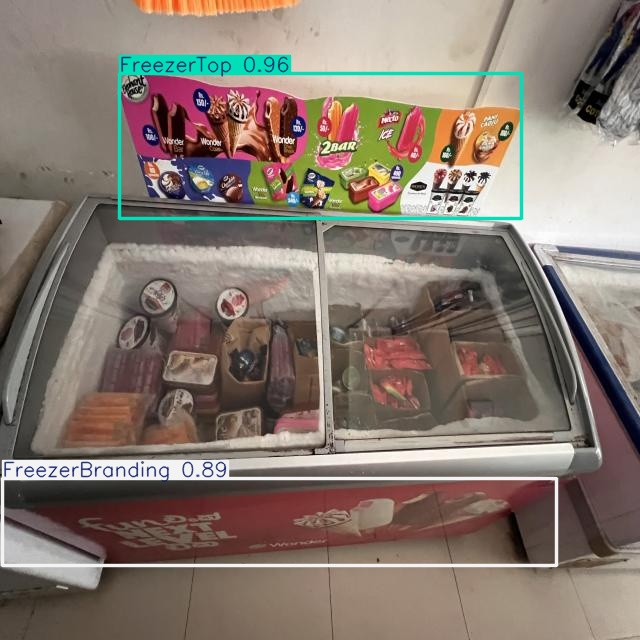

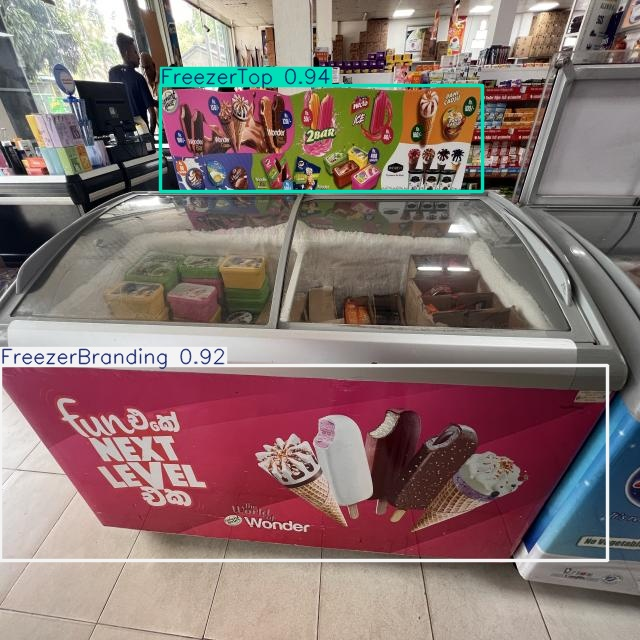

...

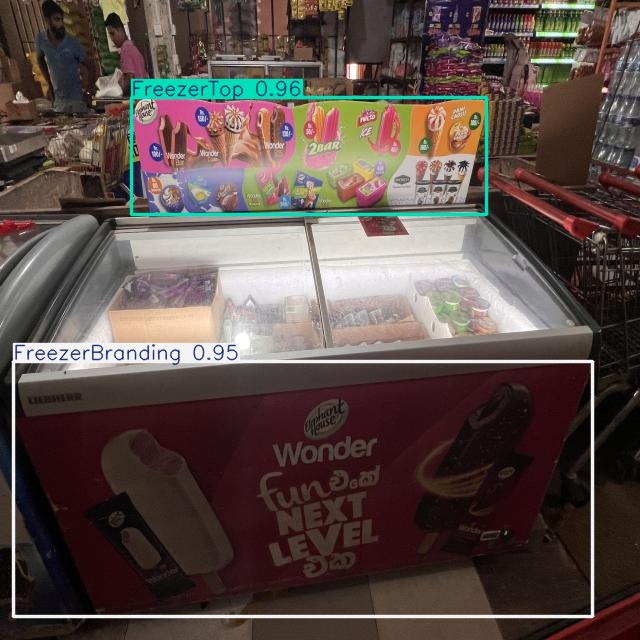

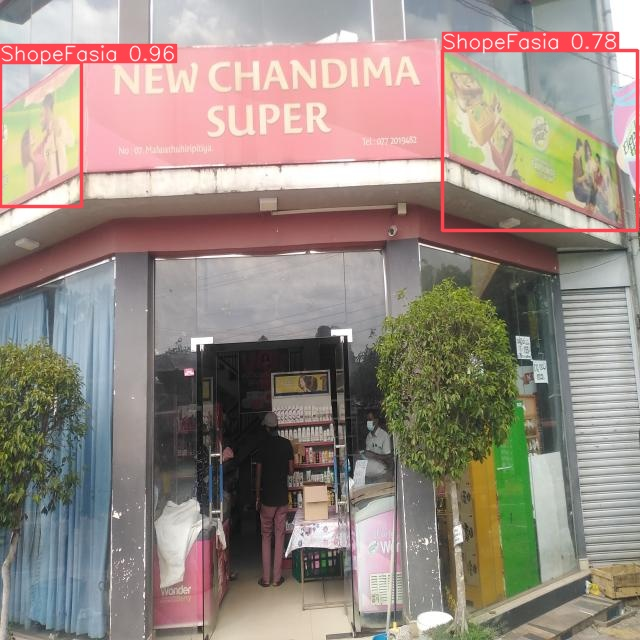

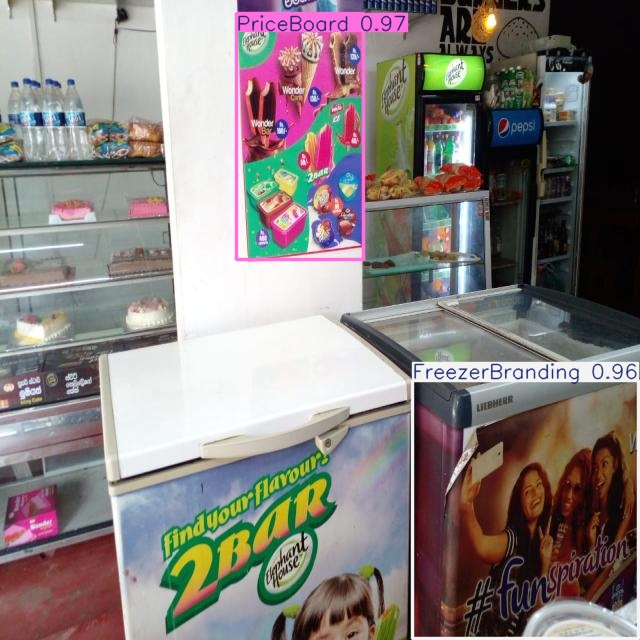

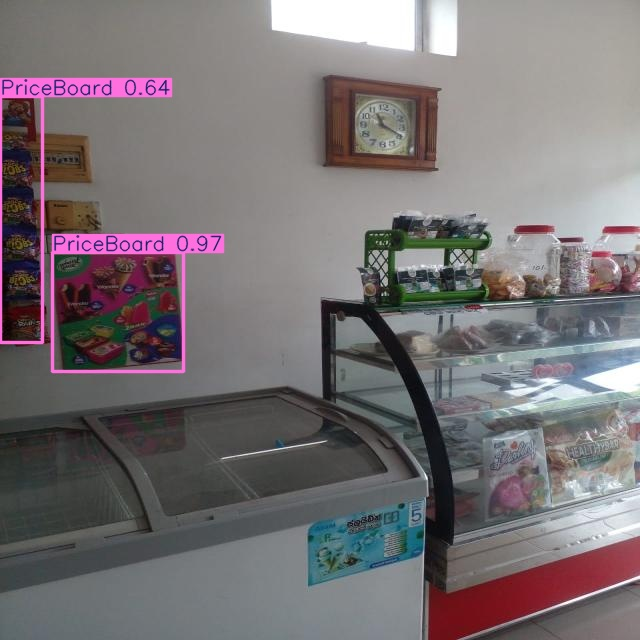

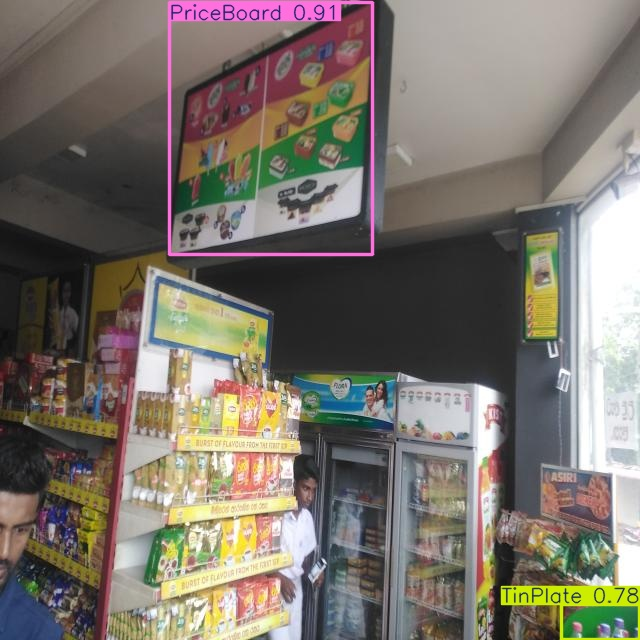

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob('/content/runs/detect/train2/*.jpg'):
      display(Image(filename=image_path, height=600))
      print("\n")